In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
import matplotlib.pyplot as plt
!pip3 install pyclustering prettytable

You should consider upgrading via the 'C:\Users\Alessandro\Scripts\python.exe -m pip install --upgrade pip' command.


# Imports

In [2]:
from prettytable import PrettyTable
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.cure import cure
from pyclustering.cluster.ema import *
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from tqdm import tqdm
from clusteringUtilities import *

In [3]:
DATA_PATH = get_path()

In [4]:
df_merge_scaled = pd.read_csv(DATA_PATH+'data_scaled_for_clustering.csv', sep='#')

In [5]:
non_numeric_attributes = ['id', 'user_id', 'name', 'lang', 'user_subscription', 'bot']
numeric_attributes = [attr for attr in df_merge_scaled.columns if attr not in non_numeric_attributes]
numeric_attributes.remove('pc1')
numeric_attributes.remove('pc2')

# DB Scan

In [6]:
try:
  os.mkdir('dbscan')
except:
  pass

In [7]:
dist = pdist(df_merge_scaled[numeric_attributes], 'euclidean')
dist_matrix = squareform(dist)

First we compute the distance matrix to choose the epsilon parameter.
We choose quite a high k since we have a considerably high amount of samples and high dimensionality

In [8]:
distances = list()
k = 10
for d in dist_matrix:
    index_kth_distance = np.argsort(d)[k]
    distances.append(d[index_kth_distance])

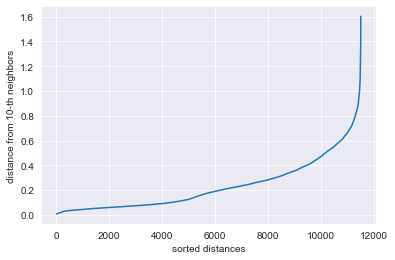

In [10]:
plt.plot(range(0, len(distances)), sorted(distances))
plt.ylabel(f'distance from {k}-th neighbors')
plt.xlabel('sorted distances')
plt.savefig('dbscan/distances_curve.png')

The knee of the curve is around 0.4, so values around this point will be investigated. Interstingle, our curve bens in the 0.1 neighborhood, hence also this zone is worth investigating.

In [7]:
min_samples = 2*len(numeric_attributes)
min_samples

70

In [8]:
table = PrettyTable(field_names=['eps', 'silohuette', 'DB score', 'n clusters'])
for eps in tqdm([0.35,0.4,0.425,0.45,0.5,0.55,0.6]):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit(df_merge_scaled[numeric_attributes])
    n_clusters = len(np.unique(clusters.labels_))
    silhouette, DBscore = get_metrics(df_merge_scaled[numeric_attributes], dbscan.labels_, print_out=False)
    table.add_row([eps, silhouette, DBscore, n_clusters])
print(table)

100%|██████████| 7/7 [00:58<00:00,  8.39s/it]

+-------+---------------------+--------------------+------------+
|  eps  |      silohuette     |      DB score      | n clusters |
+-------+---------------------+--------------------+------------+
|  0.35 | 0.19775416526538708 | 1.3849504728111701 |     14     |
|  0.4  |  0.2534968141981941 | 1.3904360513799991 |     19     |
| 0.425 | 0.27189299658446026 | 1.4501993133555535 |     15     |
|  0.45 |  0.2829950471028034 | 1.4757162792819813 |     15     |
|  0.5  |  0.2930894490007977 | 1.5619417173263626 |     14     |
|  0.55 | 0.23571357779840438 | 1.7479209514294265 |     9      |
|  0.6  | 0.14664379513820425 | 1.754674669114147  |     8      |
+-------+---------------------+--------------------+------------+


In [8]:
dbscan = DBSCAN(eps=0.5, min_samples=min_samples)
clusters = dbscan.fit(df_merge_scaled[numeric_attributes])

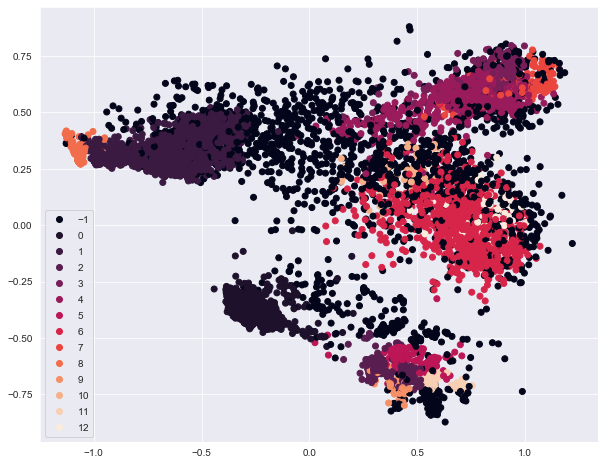

In [21]:
scatterplot(df_merge_scaled, 'pc1', 'pc2', clusters.labels_, filename="dbscan/scatter.png", figsize=(10,8))

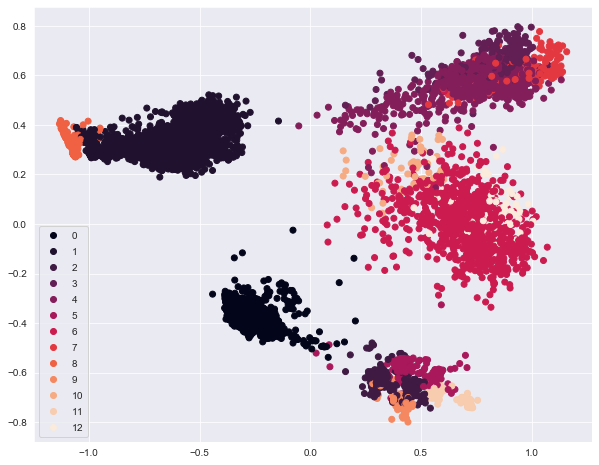

In [22]:
scatterplot(df_merge_scaled[clusters.labels_ != -1], 'pc1', 'pc2', clusters.labels_[clusters.labels_ != -1], filename="dbscan/scatter.png", figsize=(10,8))

Number of users classified as noise by dbscan

In [23]:
(clusters.labels_==-1).sum()

1917

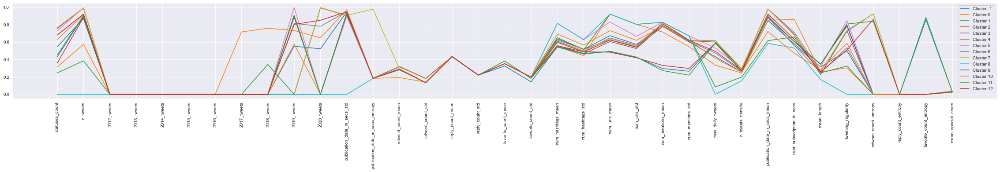

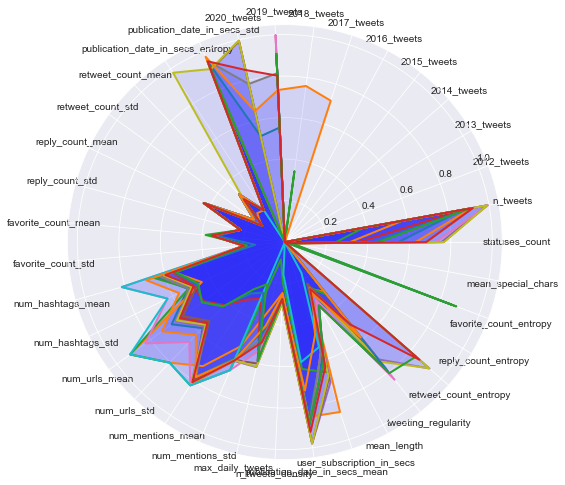

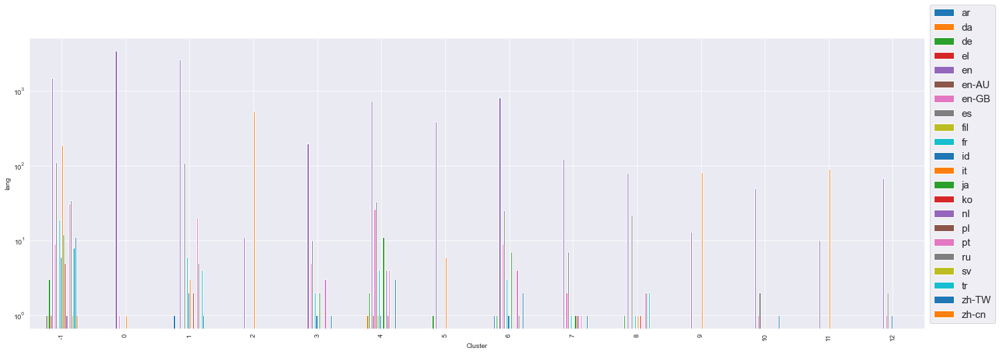

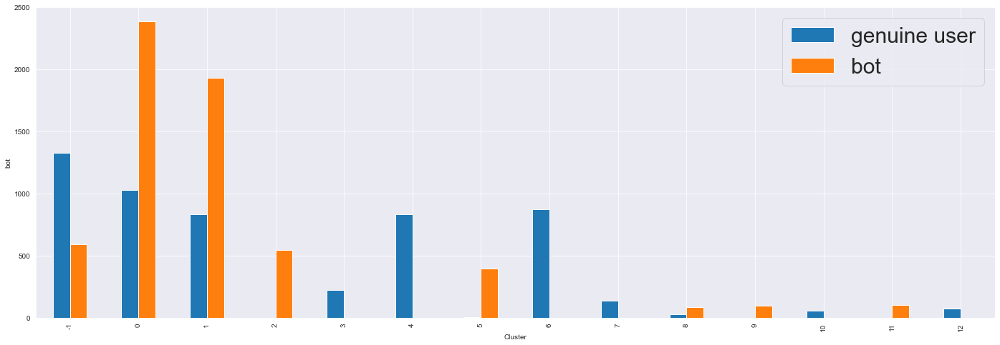

In [24]:
plots(df_merge_scaled, clusters.labels_, path="dbscan", attributes=numeric_attributes)

In [25]:
df_denoised = df_merge_scaled[clusters.labels_!=-1]

# KMeans

In [26]:
try:
  os.mkdir('kmeans')
except:
  pass

K means is run in two ways: with the complete set of users and removing the samples identified as noisy by DBscan

In [27]:
def find_optimal_k(df, max_k=40):
    sse_list = list()

    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, n_init=10, max_iter=300)
        kmeans.fit(df)
        sse_list.append(kmeans.inertia_)

    plt.plot(range(2, len(sse_list) + 2), sse_list)
    plt.xlabel('Number of clusters')
    plt.ylabel('SSE')
    plt.show()

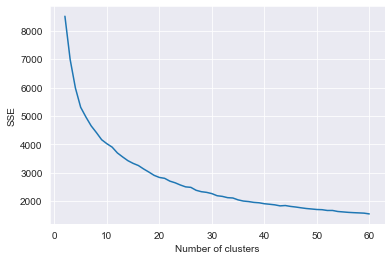

In [28]:
find_optimal_k(df_merge_scaled[numeric_attributes], max_k=60)

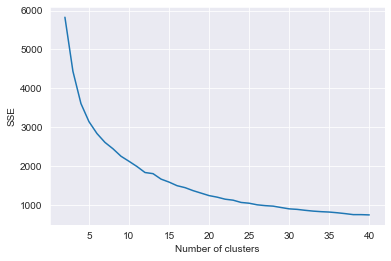

In [29]:
find_optimal_k(df_denoised[numeric_attributes])

The optimal number of clusters seems to be around 10.

In [32]:
def kmeans_analysis(df, k, n_init=20, max_iter=300, out_dir=None, combinations=False):
    try:
        os.mkdir(out_dir)
    except FileExistsError:
        pass

    kmeans = KMeans(n_clusters=k, n_init=n_init, max_iter=max_iter)
    kmeans.fit(df[numeric_attributes])
    cent = kmeans.cluster_centers_

    get_metrics(df[numeric_attributes], kmeans.labels_)

    if combinations:
        try:
            os.mkdir(os.path.join(out_dir, 'combinations'))
        except FileExistsError:
            pass
        combs = combinations(df[numeric_attributes].columns, 2)
        os.mkdir('kmeans')
        os.mkdir('kmeans/log_denoised')
        for comb in combs:
            plt.ylabel(comb[1])
            plt.xlabel(comb[0])
            print(*comb)
            scatterplot(df, *comb, kmeans.labels_, centroids=cent,
                        filename=os.path.join(out_dir, 'combinations', f"scatterplot_{comb[1]}_{comb[0]}.png"))
    else:
        scatterplot(df, 'pc1', 'pc2', kmeans.labels_,
                    centroids=cent, filename=os.path.join(out_dir, "clusters"))

    plots(df, kmeans.labels_, path = out_dir, centroids = cent, attributes=numeric_attributes)

Silouhette score: 0.33628554698215546
Davies Bouldin score: 1.5171827558483577


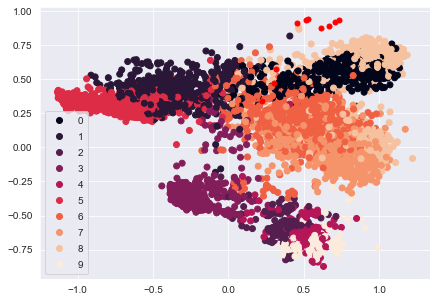

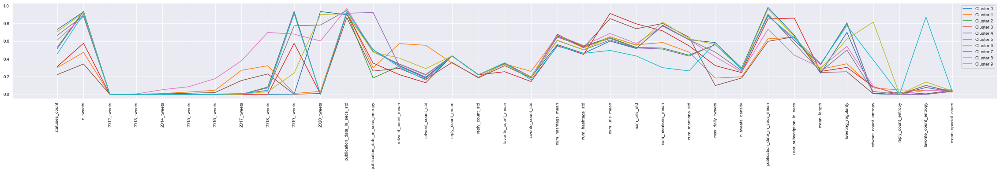

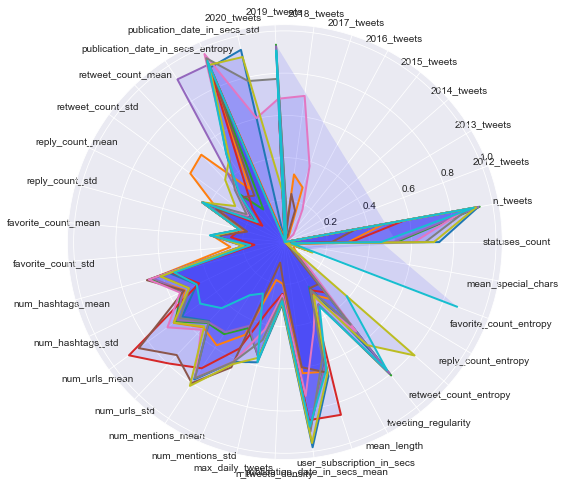

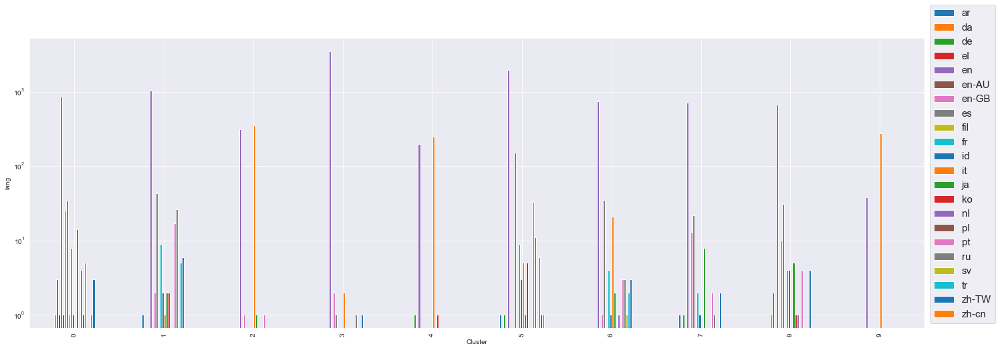

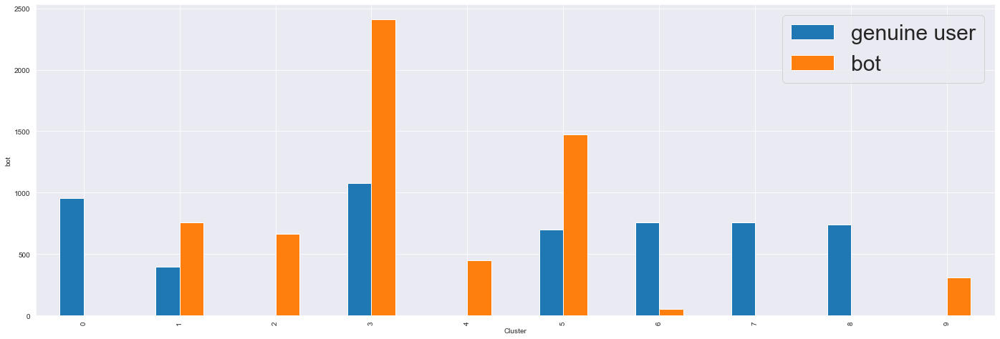

In [33]:
kmeans_analysis(df_merge_scaled, k=10, out_dir='kmeans/scaled_k10')

Silouhette score: 0.3311909235073203
Davies Bouldin score: 1.4845853336973116


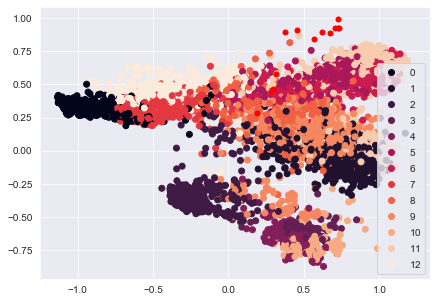

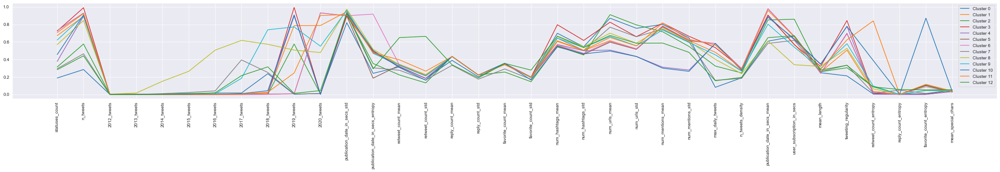

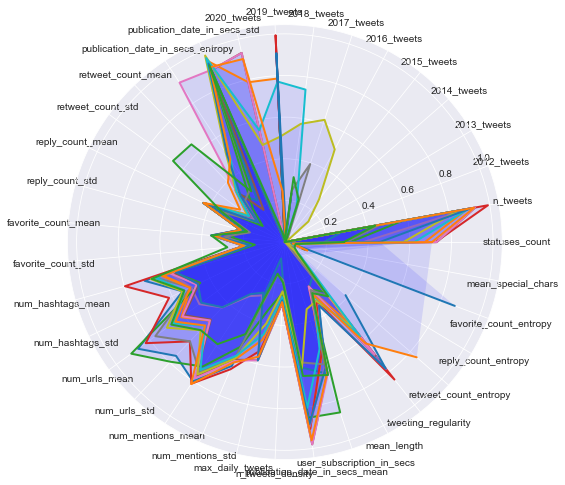

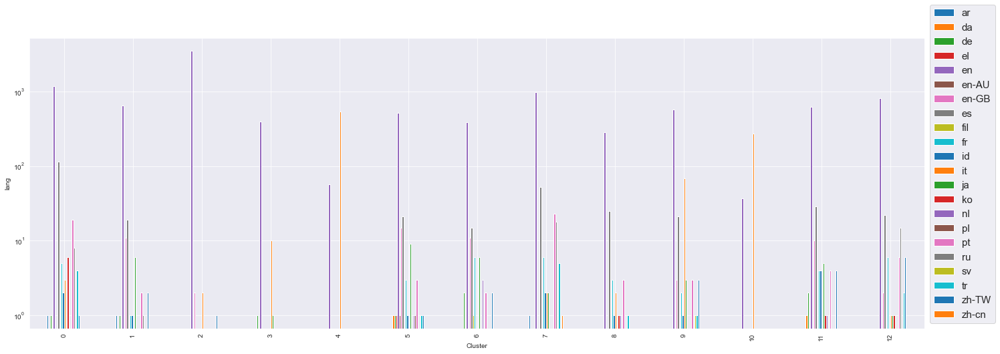

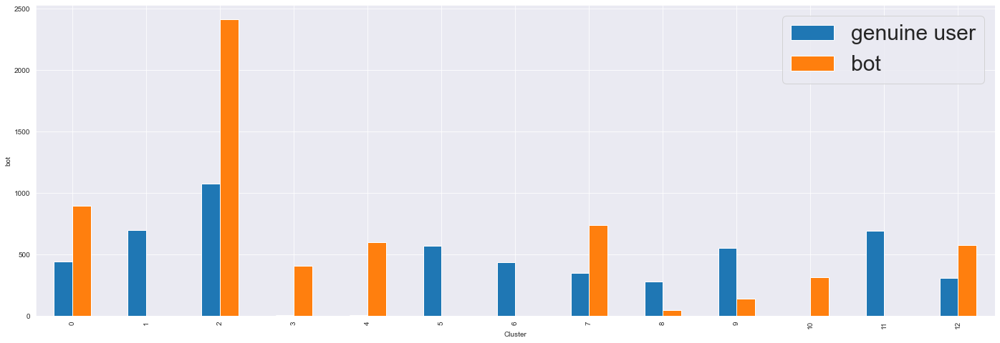

In [34]:
kmeans_analysis(df_merge_scaled, k=13, out_dir='kmeans/scaled_k12')

Silouhette score: 0.40206045116553574
Davies Bouldin score: 1.293099834540898


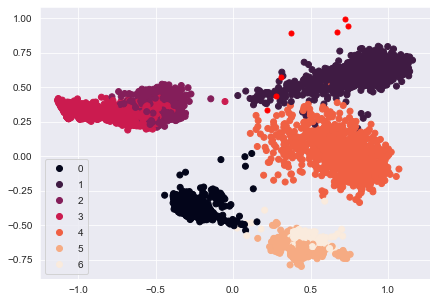

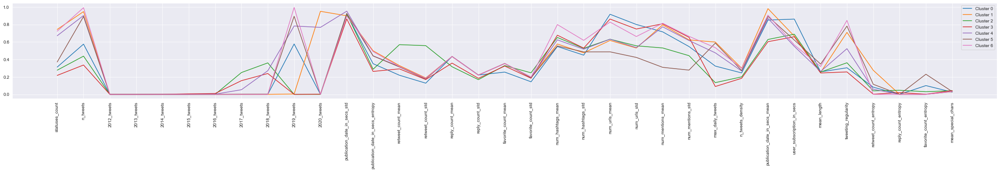

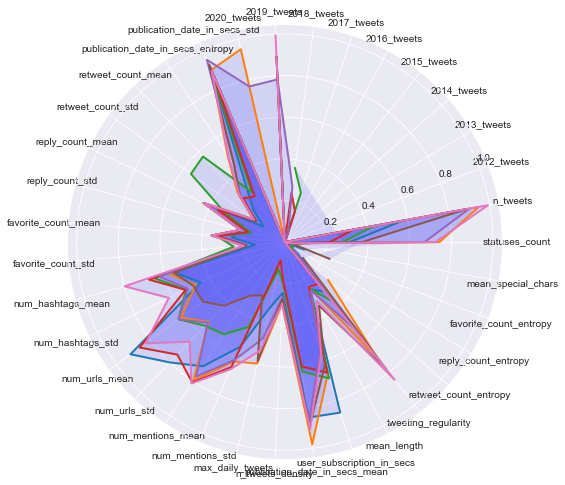

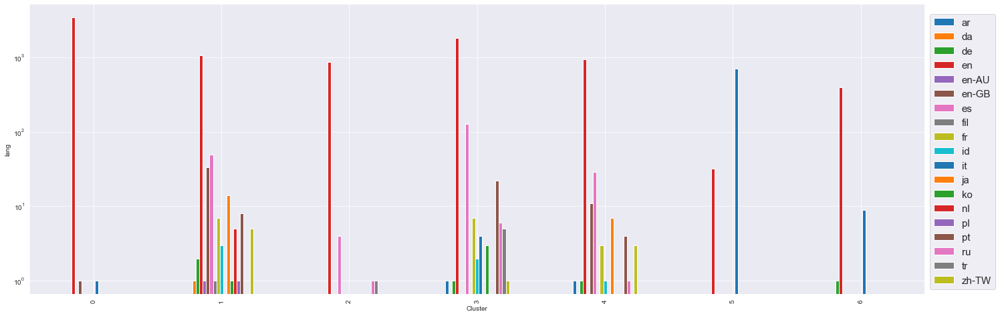

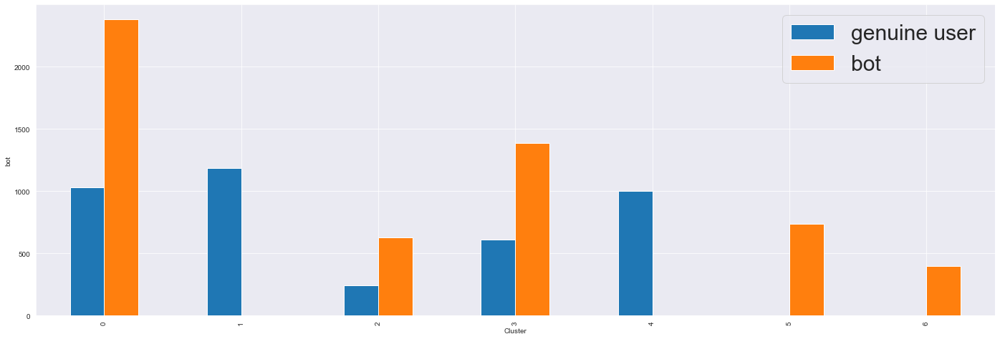

In [35]:
kmeans_analysis(df_denoised, k=7, out_dir='kmeans/denoised_k7')

Silouhette score: 0.41149319797604245
Davies Bouldin score: 1.244371141596833


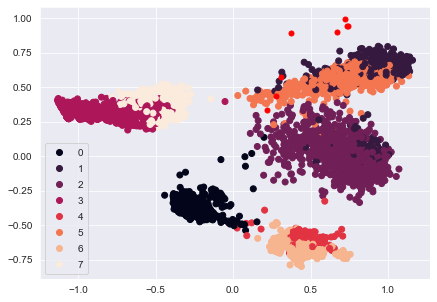

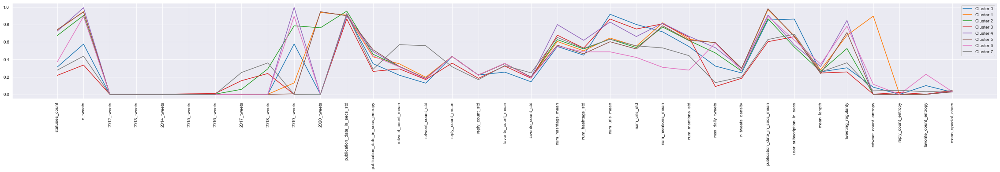

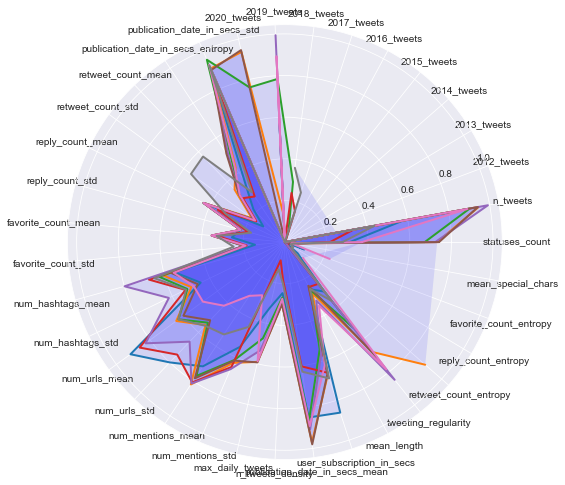

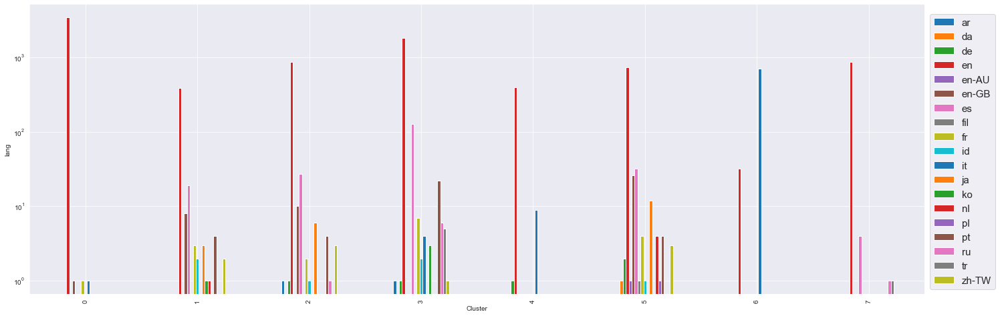

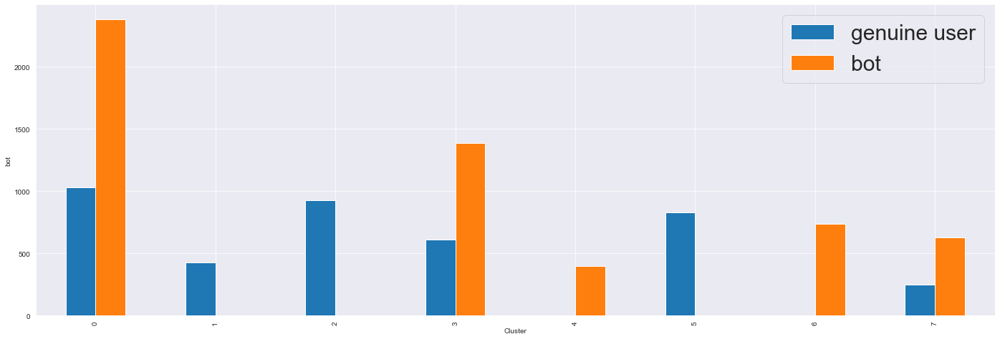

In [36]:
kmeans_analysis(df_denoised, k=8, out_dir='kmeans/denoised_k8')

Silouhette score: 0.4031731674260144
Davies Bouldin score: 1.255303866042535


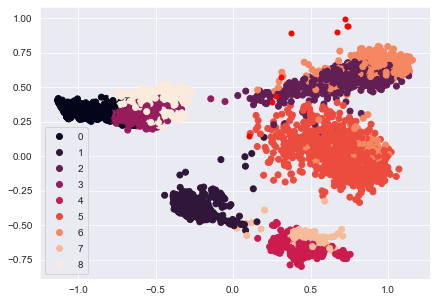

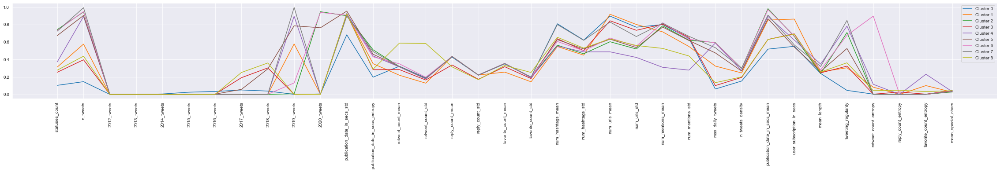

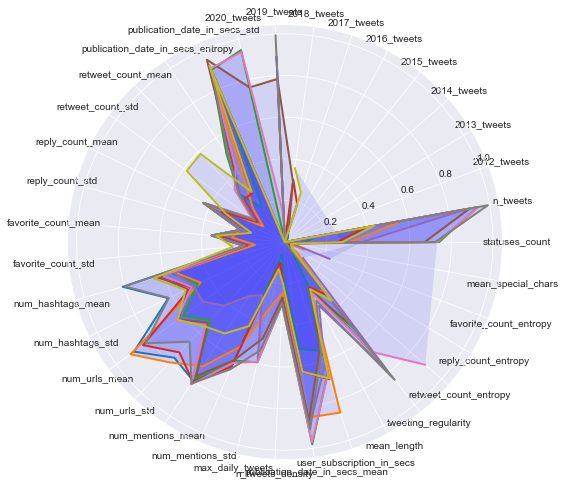

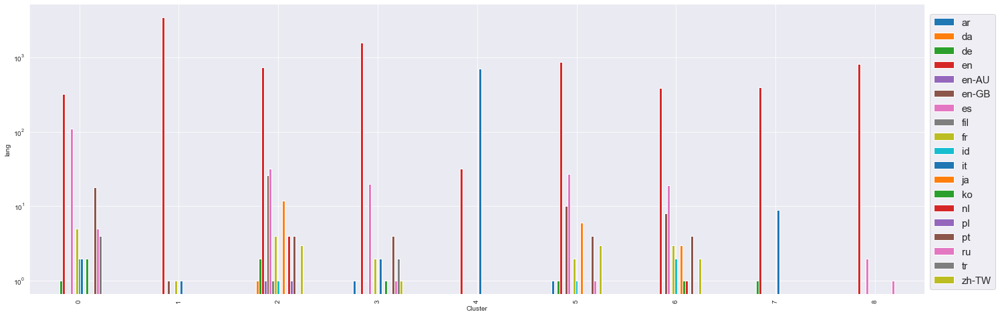

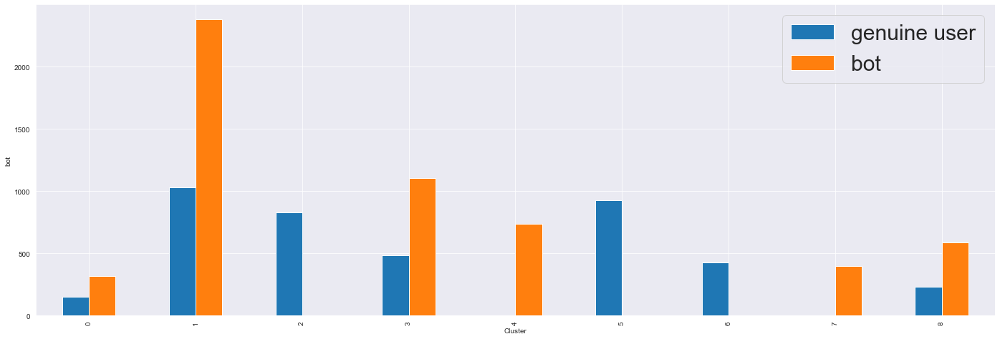

In [37]:
kmeans_analysis(df_denoised, k=9, out_dir='kmeans/denoised_k9')

Silouhette score: 0.41363795718006535
Davies Bouldin score: 1.2070158496158556


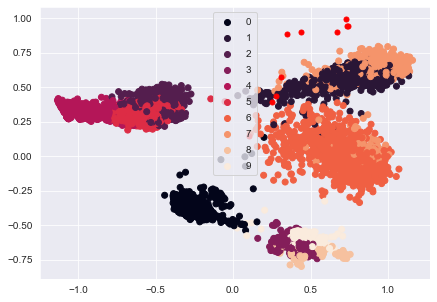

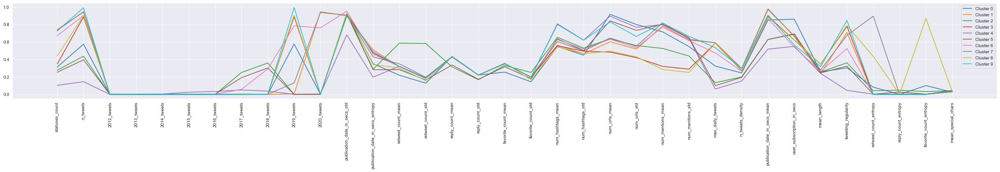

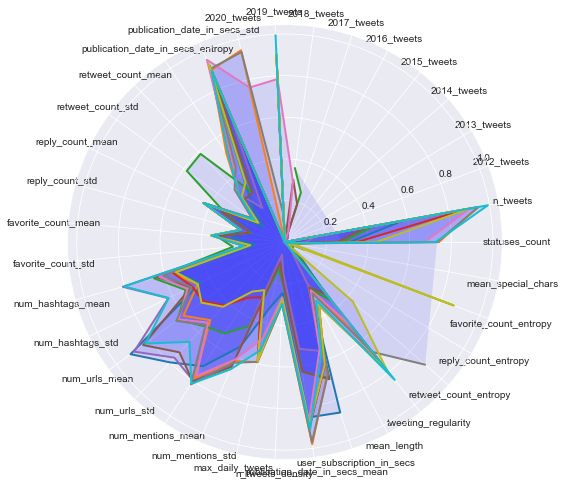

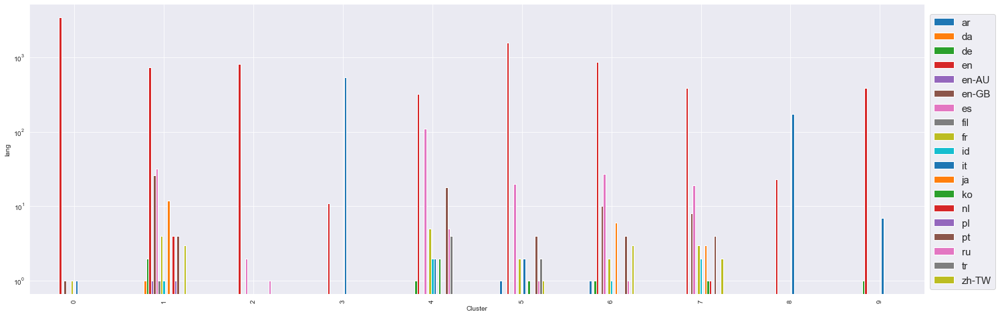

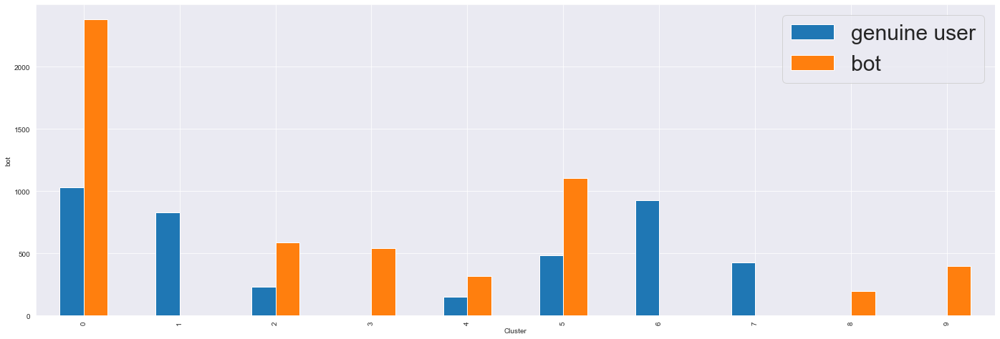

In [39]:
kmeans_analysis(df_denoised, k=10, out_dir='kmeans/denoised_k10')

# Hierarchical clustering

In [40]:
try:
  os.mkdir('hierarchical')
except FileExistsError:
  pass

In [41]:
df_merge_scaled[numeric_attributes].loc[[0,1,3]].mean()

statuses_count                      0.316112
n_tweets                            0.678863
2012_tweets                         0.000000
2013_tweets                         0.000000
2014_tweets                         0.000000
2015_tweets                         0.000000
2016_tweets                         0.000000
2017_tweets                         0.000000
2018_tweets                         0.000000
2019_tweets                         0.680968
2020_tweets                         0.000000
publication_date_in_secs_std        0.918817
publication_date_in_secs_entropy    0.184220
retweet_count_mean                  0.245703
retweet_count_std                   0.140785
reply_count_mean                    0.433457
reply_count_std                     0.220965
favorite_count_mean                 0.218723
favorite_count_std                  0.121462
num_hashtags_mean                   0.538350
num_hashtags_std                    0.456405
num_urls_mean                       0.779331
num_urls_s

In [42]:
def hierarchical_analysis(df,metric, method, truncate_mode, p, n_clusters, directory, plot=False):
    df = df.reset_index()
    distances = pdist(df[numeric_attributes], metric=metric)
    dlinkage = linkage(distances, metric=metric, method=method)

    labels = fcluster(dlinkage,n_clusters,criterion='maxclust')
    if plot:
        try:
            os.mkdir(os.path.join('hierarchical',directory))
        except FileExistsError:
            pass

        dendrogram(dlinkage, truncate_mode=truncate_mode, p=p, leaf_rotation=90)
        plt.savefig(os.path.join('hierarchical',directory,"dendrogram.png"))
        plt.show()
        scatterplot(df[numeric_attributes+['pc1','pc2']], 'pc1','pc2',c_labels=labels,filename=os.path.join('hierarchical',directory, 'scatterplot.png'))

        plots(df, labels, os.path.join('hierarchical',directory), attributes=numeric_attributes)


    #print(f"SSE: {sse(df[numeric_attributes],labels)}")
    if len(labels) > 1:
        try:
            return get_metrics(df[numeric_attributes], labels, print_out=False)
        except:
            return 0,0
    else: return 0,0

In [43]:
def hierarchial_gs(df):
    table = PrettyTable(colums=['metric','method','truncation_mode','truncation_level','n_clustes','sse',])
    for metric in ['cityblock','correlation', 'cosine', 'dice', 'euclidean']:
        methods = ['complete','single','average','weighted']
        if metric == 'euclidean':
            methods += ['ward','median','centroid']
        for method in methods:
            for truncation_mode in [None, 'lastp','level']:
                for level in [2,3,4]:
                    for k in [7,8,9,10]:
                        metrics = hierarchical_analysis(df[numeric_attributes], metric, method, truncate_mode=truncation_mode, p=level, n_clusters=k,
                                                           directory=f'hierarchical/{metric}_{method}_{truncation_mode}_{level}_{k}')
                        table.add_row([metric, method, truncation_mode, level, k, *metrics])
    print(table)

In [44]:
#hierarchial_gs(df_merge_scaled)

|  euclidean  | centroid |  level  |    4    |    8    |  0.23683322871264656  | 0.6957750301079821 |
|  euclidean  | centroid |  level  |    4    |    7    |   0.2587391353800509  | 0.7143377294957671 |
|  euclidean  |   ward   |   None  |    4    |    10   |  0.32528308553781576  | 1.5993941733422534 |
|  euclidean  |   ward   |   None  |    4    |    10   |  0.32528308553781576  | 1.5993941733422534 |
|  euclidean  | weighted |  lastp  |    2    |    8    |   0.2931433199083441  | 1.4713046016118956 |
|  euclidean  |  single  |  lastp  |    2    |    9    |  0.18279600083572384  | 0.5517771198190936 |
|    cosine   | average  |  level  |    3    |    9    |  0.23279880210801807  | 1.1422942948774821 |
| correlation | average  |  level  |    3    |    7    |  0.25115822395397913  | 0.8985090713314801 |

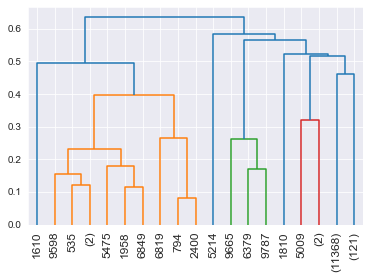

(0.25115822395397913, 0.89850907133148)

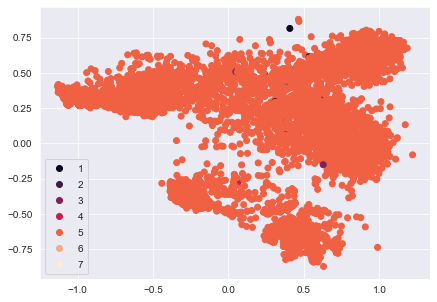

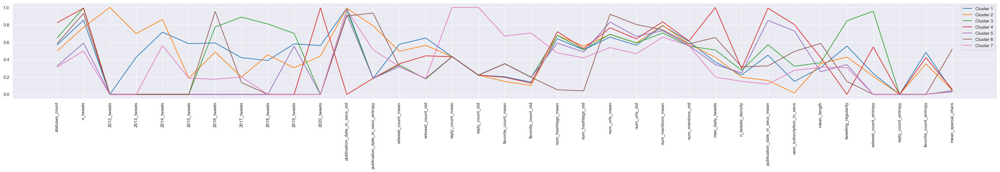

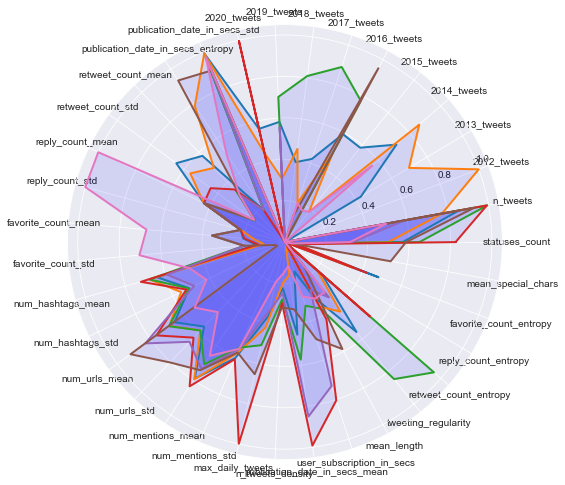

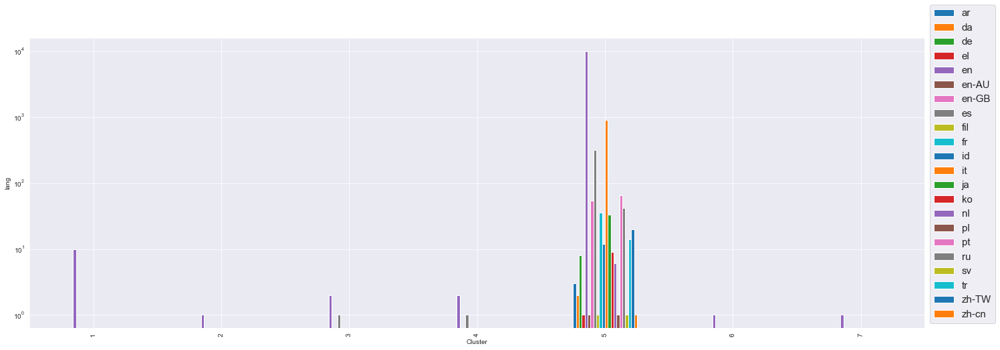

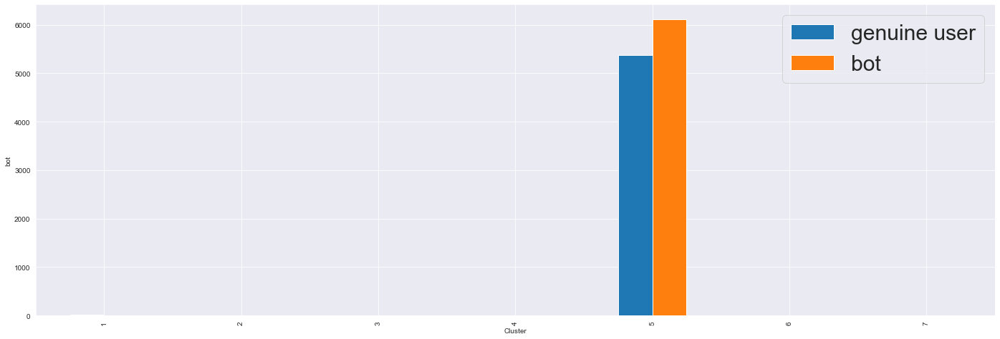

In [45]:
hierarchical_analysis(df_merge_scaled,'correlation','average','level',p=5,n_clusters=7,directory='correlation_average_level3_k7',plot=True)

This approach is tested on both noisy and denoised data.

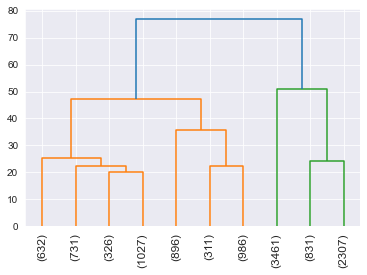

(0.32528308553781576, 1.5993941733422534)

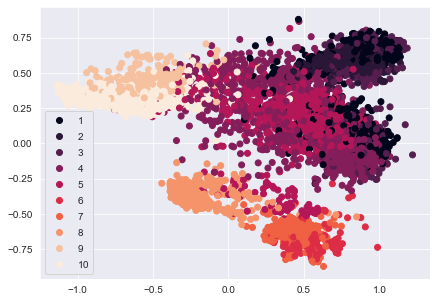

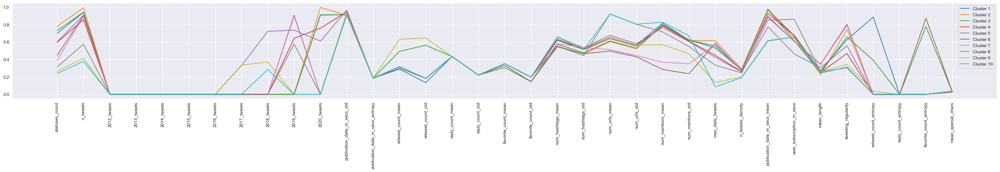

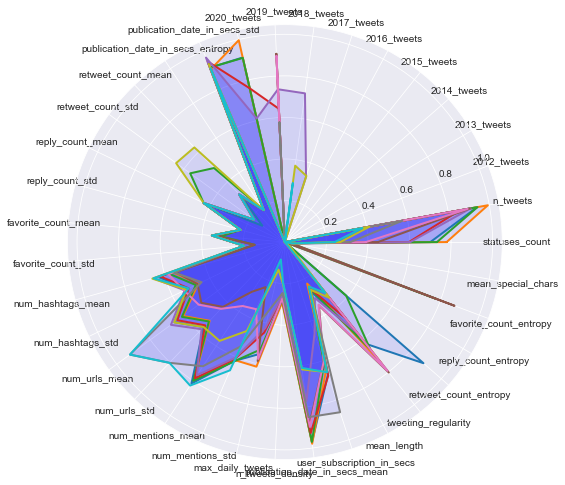

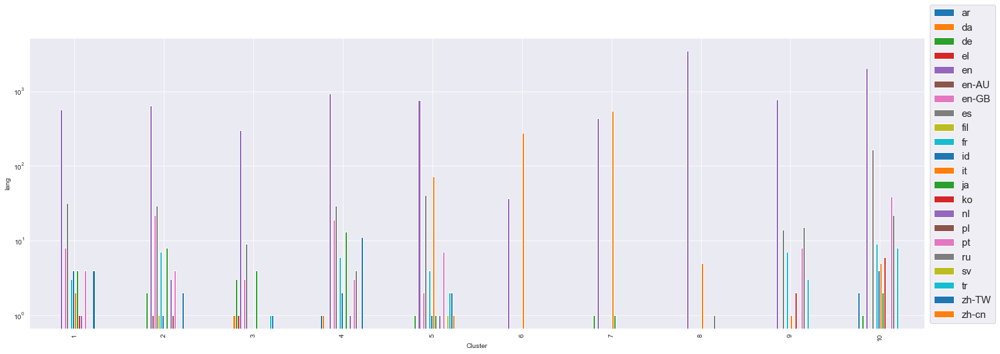

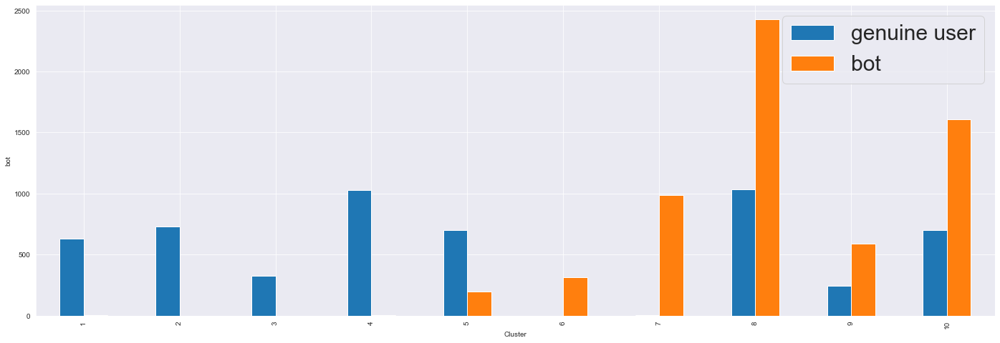

In [47]:
hierarchical_analysis(df_merge_scaled,'euclidean','ward','lastp',p=10,n_clusters=10,directory='euclidean_ward_k10_p4',plot=True)

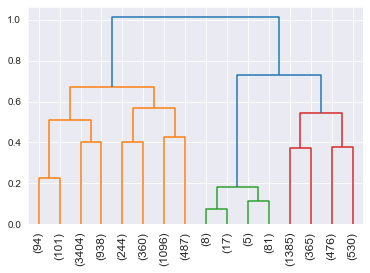

(0.2614549153355632, 1.820202583390177)

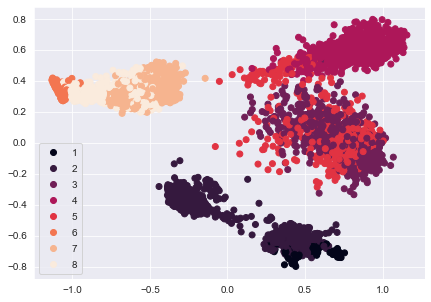

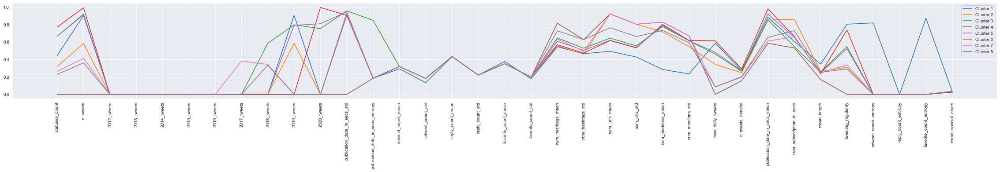

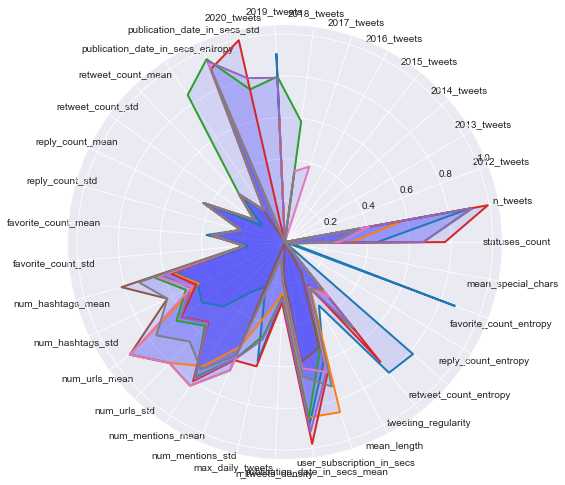

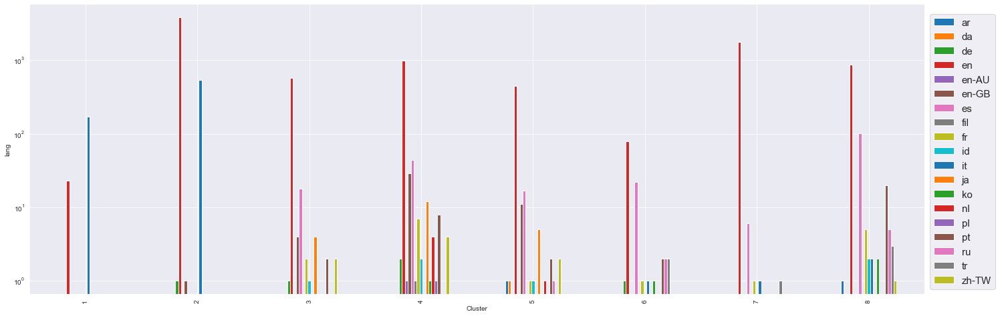

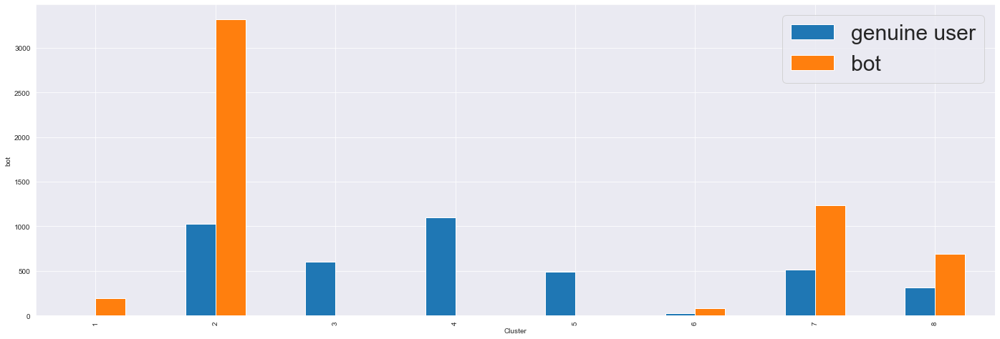

In [48]:
hierarchical_analysis(df_denoised,'correlation','complete','level',p=3,n_clusters=8,directory='denoised_correlation_k10',plot=True)

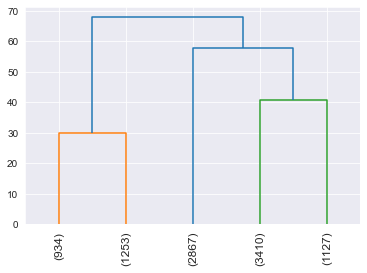

(0.39487932680433996, 1.3008065786385836)

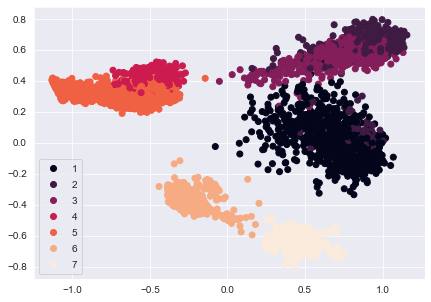

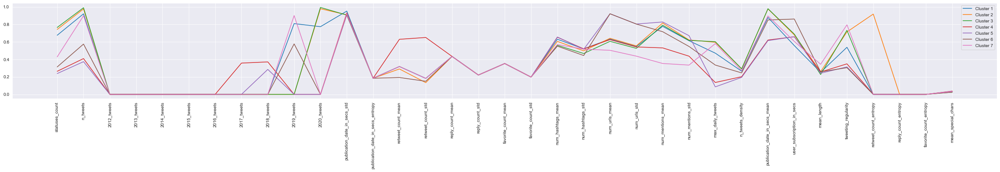

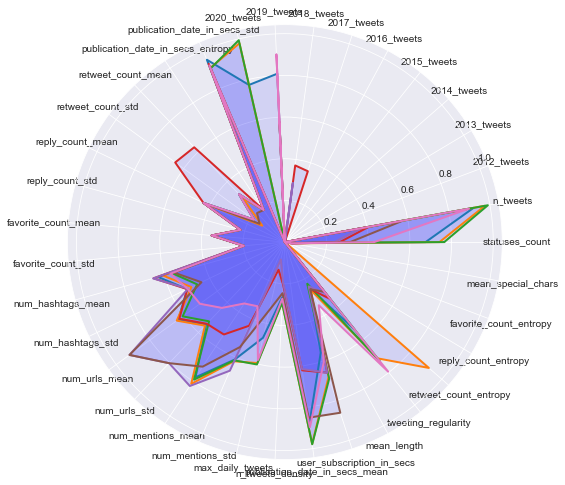

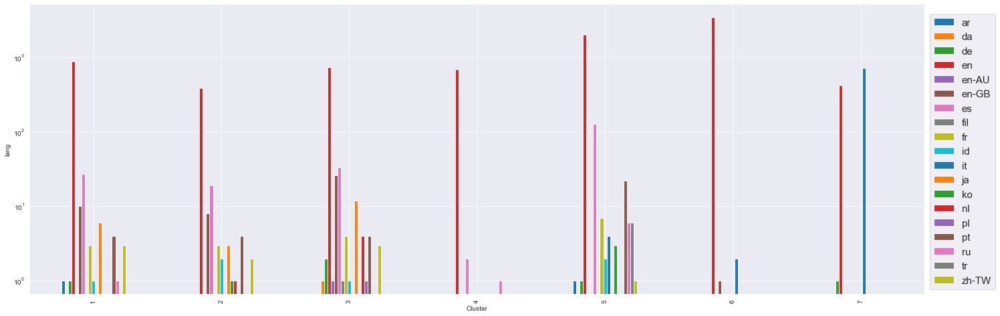

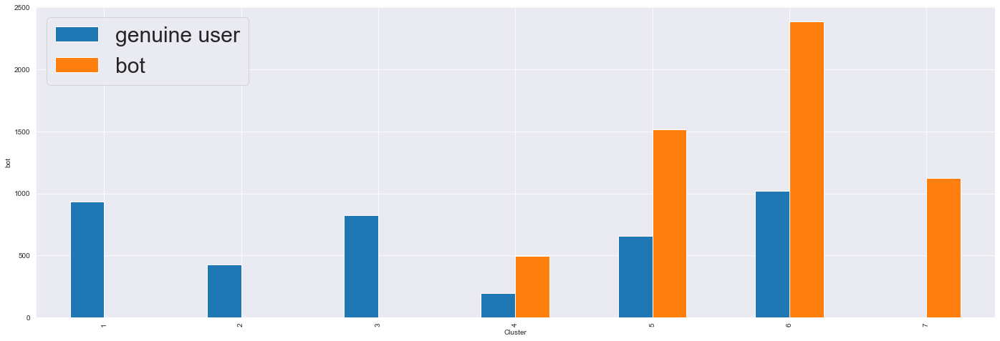

In [49]:
hierarchical_analysis(df_denoised,'euclidean','ward','lastp',p=5,n_clusters=7,directory='denoised_ward_k7',plot=True)

# Agglomerative clustering

In [50]:
def agglomerative_analysis(df, n_clusters, metric='euclidean', linkage='ward'):
    clusters = AgglomerativeClustering(affinity=metric, n_clusters=n_clusters, linkage=linkage)
    clusters.fit(df_merge_scaled[numeric_attributes])

    path=f'agglomerative/{metric}_{linkage}_k{n_clusters}/'
    get_metrics(df_merge_scaled[numeric_attributes], clusters.labels_)
    plots(df_merge_scaled, clusters.labels_, path=path, attributes=numeric_attributes)
    plt.show()
    scatterplot(df_merge_scaled, 'pc1', 'pc2', clusters.labels_,filename=os.path.join(path,'scatterplot.png'))

Silouhette score: 0.32528308553781576
Davies Bouldin score: 1.5993941733422532


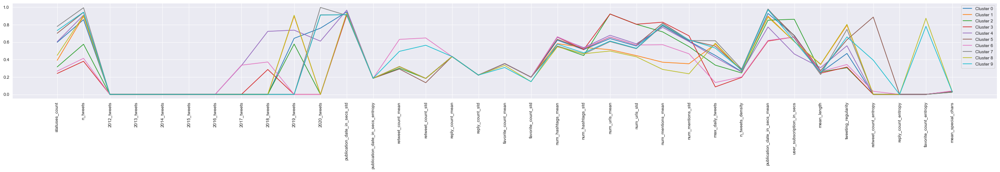

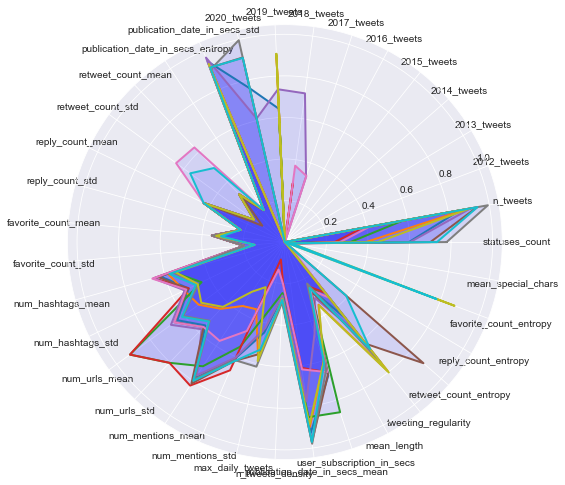

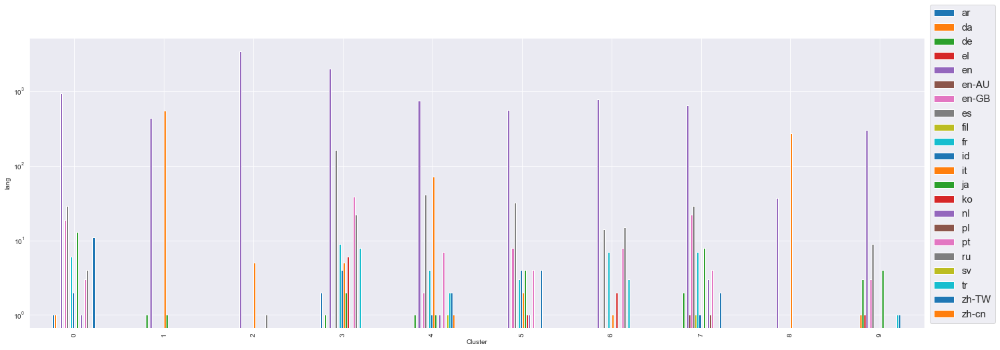

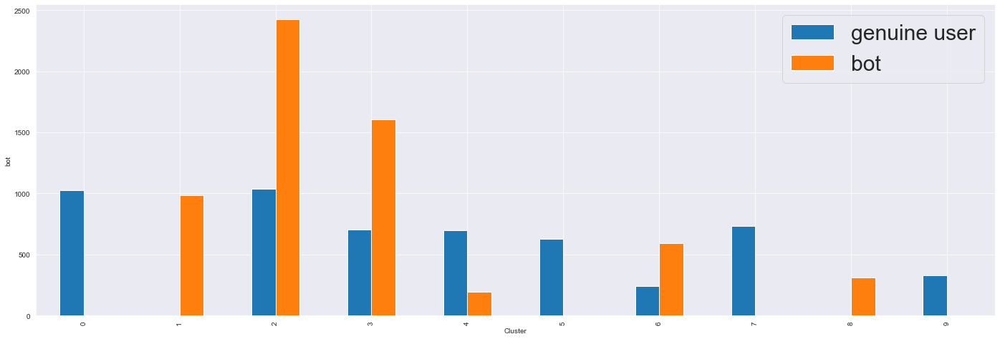

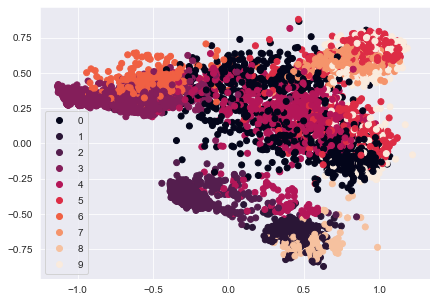

In [51]:
agglomerative_analysis(df_merge_scaled,10)

Silouhette score: 0.30722508149070177
Davies Bouldin score: 1.6333326199732454


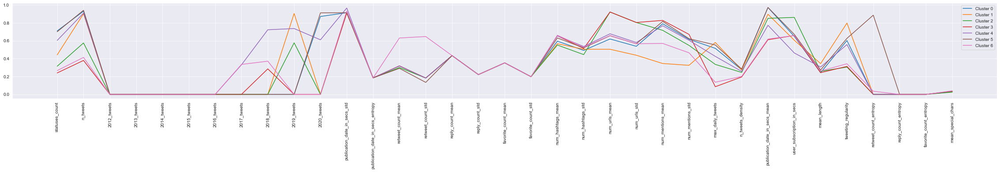

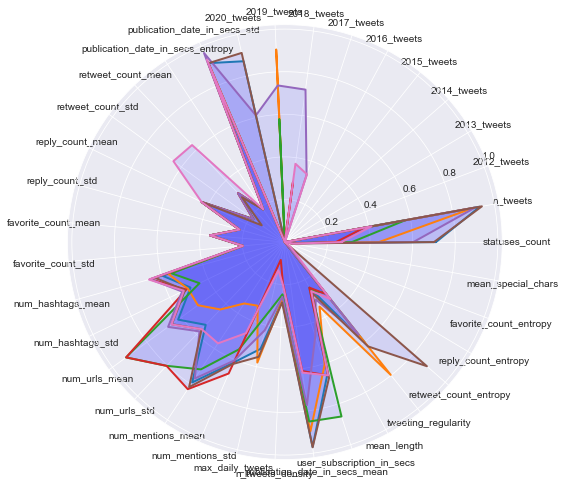

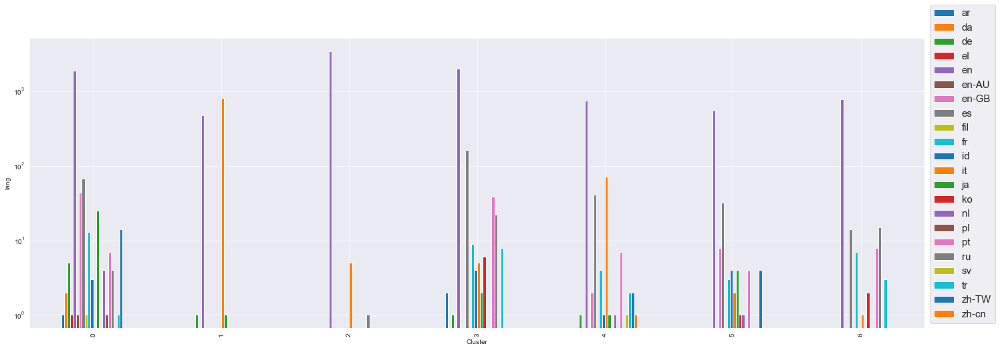

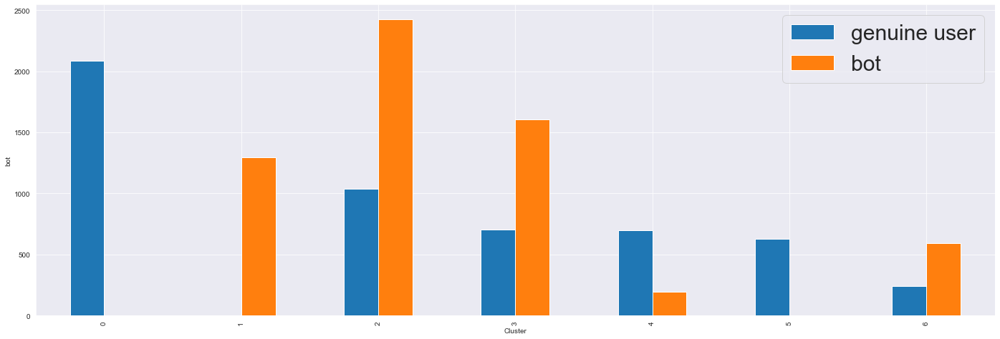

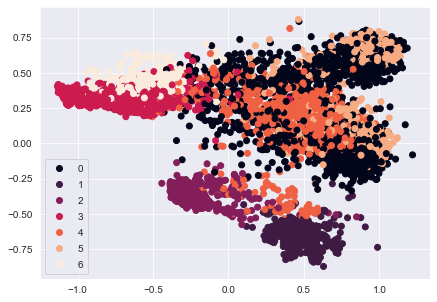

In [52]:
agglomerative_analysis(df_merge_scaled,7)

# X-Means

from https://github.com/annoviko/pyclustering/

In [53]:
try:
  os.mkdir('xmeans')
except:
  pass

In [60]:

from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

k_start = 2
clusters_start = kmeans_plusplus_initializer(df_merge_scaled[numeric_attributes], 7).initialize()
 
# By defeault max # of clusters is 20, but we set it to 10
x_means = xmeans(df_merge_scaled[numeric_attributes], clusters_start, tolerance=1000000, kmax=100, repeat=300) #, initial_centers, 20)
x_means.process()
 
# Extract clustering results: clusters and their centers
clusters = x_means.get_clusters()
centroids = x_means.get_centers()

print(f'Number of clusters found:', np.shape(centroids)[0])

Number of clusters found: 100


In [46]:
cluster_labels = dict()

''' 
Since for each cluster is saved the index in list of data
it is needed to convert it in such a way that
we have a list as long as the data, and in each
position it is saved the corresponding label for the
data with that index
'''
for label in range(0, np.shape(clusters)[0]):
  for i in range(0, len(clusters[label])):
    cluster_labels[clusters[label][i]] = label

cluster_labels = dict(sorted(cluster_labels.items()))

C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


In [47]:
print("SSE:", x_means.get_total_wce())
get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))

SSE: 4323.938567358317
Silouhette score: 0.265748834884786
Davies Bouldin score: 1.4622709957961344


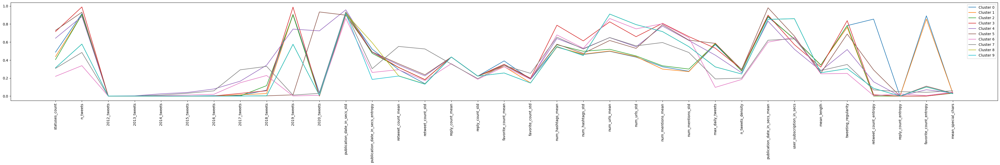

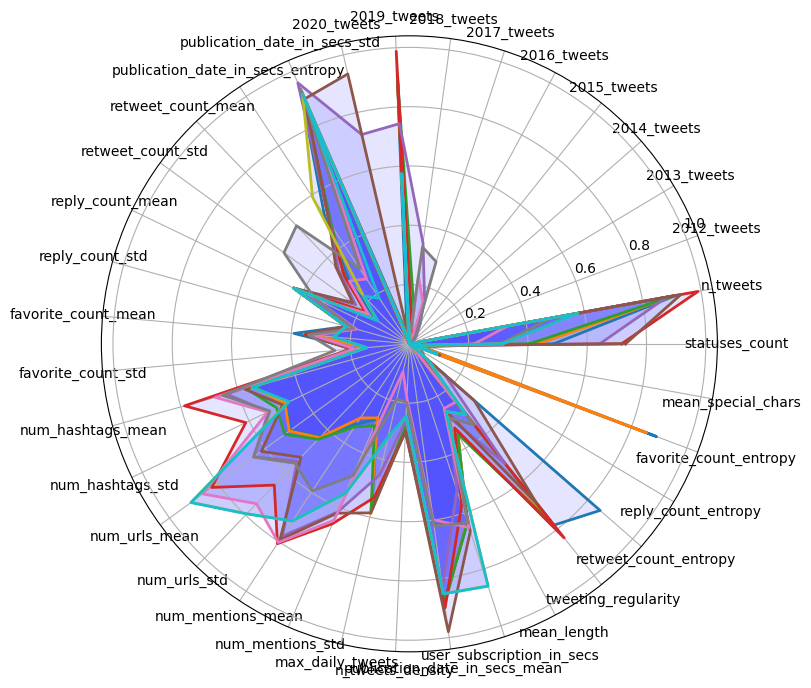

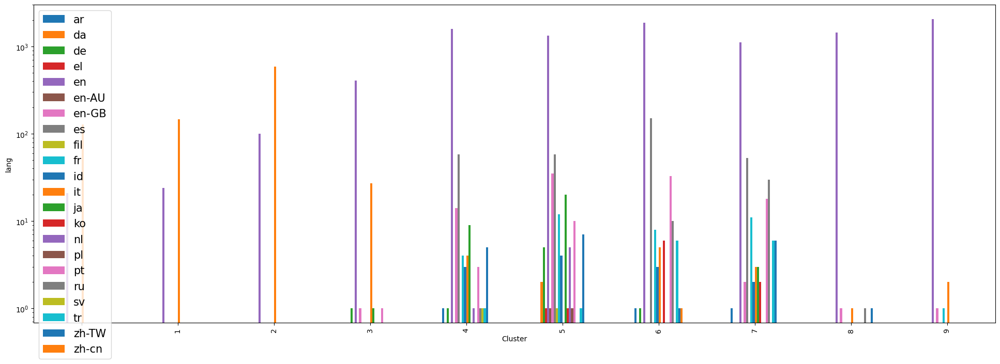

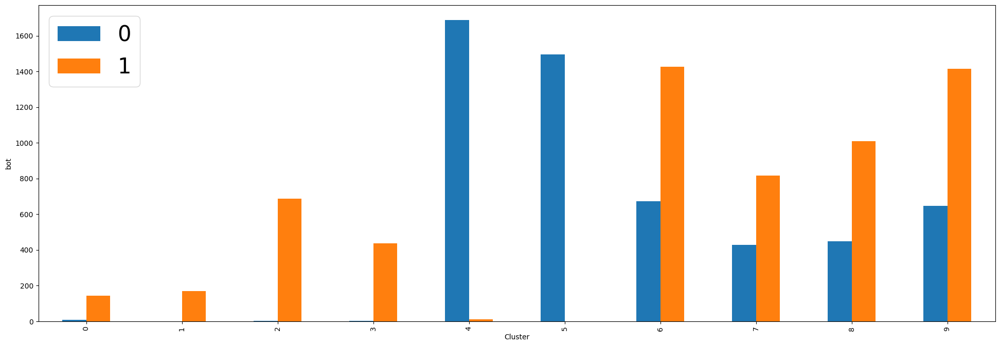

In [48]:
plots(df_merge_scaled, np.array(list(cluster_labels.values())), path='xmeans', centroids=np.array(centroids), attributes = numeric_attributes)

# G-means

In [82]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.gmeans import gmeans
from pyclustering.utils import read_sample
from pyclustering.samples.definitions import FCPS_SAMPLES
# Read sample 'Lsun' from file.
sample = df_merge_scaled[numeric_attributes].values
# Create instance of G-Means algorithm. By default algorithm start search from single cluster.
gmeans_instance = gmeans(sample, tolerance=1e-12, repeat=20, k_max=10).process()
# Extract clustering results: clusters and their centers
clusters = gmeans_instance.get_clusters()
centers = gmeans_instance.get_centers()
# Print total sum of metric errors
print("Total WCE:", gmeans_instance.get_total_wce())

Total WCE: 4019.965304461817


In [83]:
len(centers)

10

C:\Users\al\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


SSE: 1367.7972437712738
Silouhette score: 0.26464857086569743
Davies Bouldin score: 1.5622859905200148


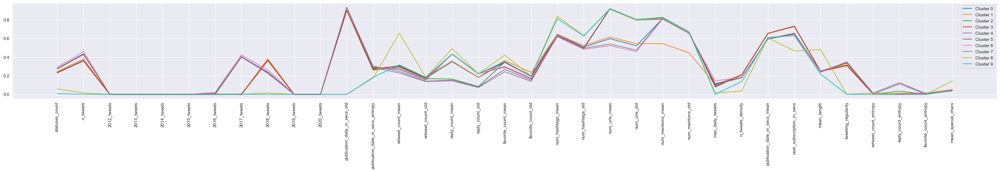

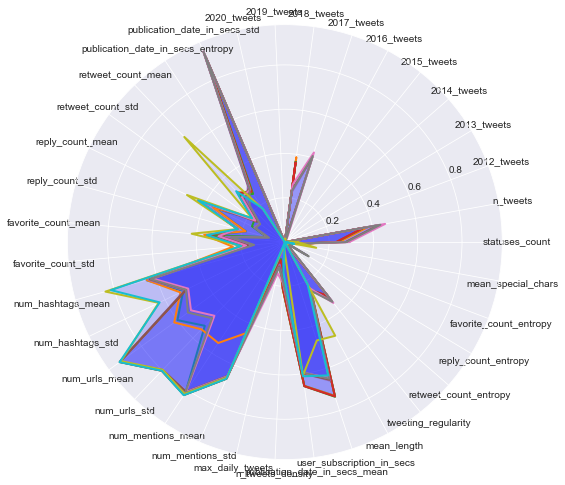

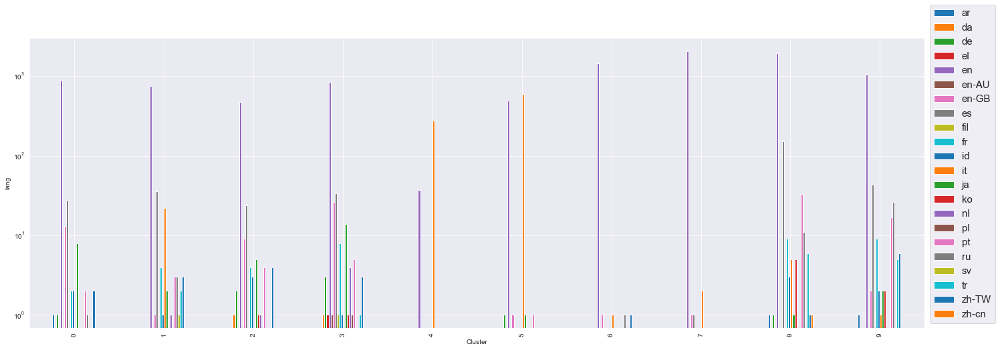

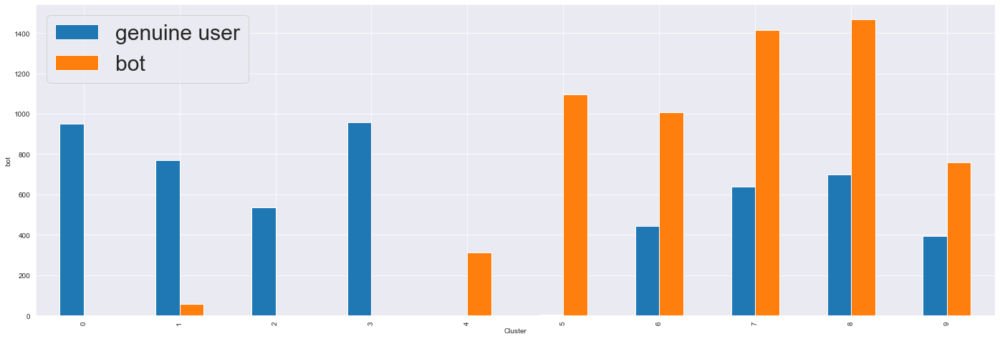

In [84]:
cluster_labels = dict()

'''
Since for each cluster is saved the index in list of data
it is needed to convert it in such a way that
we have a list as long as the data, and in each
position it is saved the corresponding label for the
data with that index
'''
for label in range(0, np.shape(clusters)[0]):
    for i in range(0, len(clusters[label])):
        cluster_labels[clusters[label][i]] = label

cluster_labels = dict(sorted(cluster_labels.items()))
print("SSE:", x_means.get_total_wce())
get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))
plots(df_merge_scaled, np.array(list(cluster_labels.values())), path='gmeans', centroids=np.array(centroids),
      attributes=numeric_attributes)

# CURE

In [54]:
try:
    os.mkdir('cure')
except:
    pass

In [69]:
def run_cure_combo(n_clusters, n_represent_points, compression):
    # create instance of cure algorithm for cluster analysis
    # request for allocation of two clusters.
    cure_instance = cure(df_merge_scaled[numeric_attributes].values, n_clusters, n_represent_points, compression, True)
    # run cluster analysis
    cure_instance.process()
    # get results of clustering
    clusters = cure_instance.get_clusters()

    print(f'Number of clusters found:', np.shape(centroids)[0])

    cluster_labels = dict()

    '''
    Since for each cluster is saved the index in list of data
    it is needed to convert it in such a way that
    we have a list as long as the data, and in each
    position it is saved the corresponding label for the
    data with that index
    '''
    for label in range(0, np.shape(clusters)[0]):
        for i in range(0, len(clusters[label])):
            cluster_labels[clusters[label][i]] = label

    cluster_labels = dict(sorted(cluster_labels.items()))

    print("SSE:", x_means.get_total_wce())
    get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))

    subdir_name = f'{n_clusters}_{n_represent_points}_{compression}'
    plots(df_merge_scaled, np.array(list(cluster_labels.values())), path=f'cure/{subdir_name}', centroids=np.array(centroids), attributes = numeric_attributes)

In [ ]:
n_clusters_list = [7,10,13]
n_represent_points_list = [25, 50]
compression_list = [0.25,0.5,0.75]
for n_clusters in n_clusters_list:
    for n_represent_points in n_represent_points_list:
        for compression in compression_list:
            print(f'{n_clusters} \t {n_represent_points} \t {compression}')
            run_cure_combo(n_clusters, n_represent_points, compression)
            print('------------------------------------------------------------')

7 	 25 	 0.25
Number of clusters found: 10
SSE: 4323.938567358317


C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.16565136504445205
Davies Bouldin score: 0.8030859907535909
------------------------------------------------------------
7 	 25 	 0.5
Number of clusters found: 10
SSE: 4323.938567358317


C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.21610102175404064
Davies Bouldin score: 0.6301447368787916
------------------------------------------------------------
7 	 25 	 0.75
Number of clusters found: 10
SSE: 4323.938567358317


C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.2194184100980048
Davies Bouldin score: 0.6430425796094517
------------------------------------------------------------
7 	 50 	 0.25
Number of clusters found: 10
SSE: 4323.938567358317


C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.20348936730902176
Davies Bouldin score: 0.645668375297789
------------------------------------------------------------
7 	 50 	 0.5
Number of clusters found: 10
SSE: 4323.938567358317


C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.2614162686529921
Davies Bouldin score: 0.608835365221583
------------------------------------------------------------
7 	 50 	 0.75
Number of clusters found: 10
SSE: 4323.938567358317


C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Silouhette score: 0.26620355855134276
Davies Bouldin score: 0.6583630170378353


C:\Users\Alessandro\Desktop\DataMining\DM_tweets\clusteringUtilities.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(50, 5))


------------------------------------------------------------
10 	 25 	 0.25


# EMA

C:\Users\Alessandro\lib\site-packages\pyclustering\cluster\ema.py:58: RuntimeWarning: overflow encountered in exp
  point_gaussian = right_const * numpy.exp( -0.5 * mean_delta.dot(inv_variance).dot(numpy.transpose(mean_delta)) )
C:\Users\Alessandro\lib\site-packages\pyclustering\cluster\ema.py:516: RuntimeWarning: invalid value encountered in double_scalars
  while(self.__stop is False) and (abs(previous_likelihood - current_likelihood) > self.__tolerance) and (current_iteration < self.__iterations):
C:\Users\Alessandro\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


Number of clusters found: 8
Silouhette score: -0.07452591441479904
Davies Bouldin score: 4.5917745764964


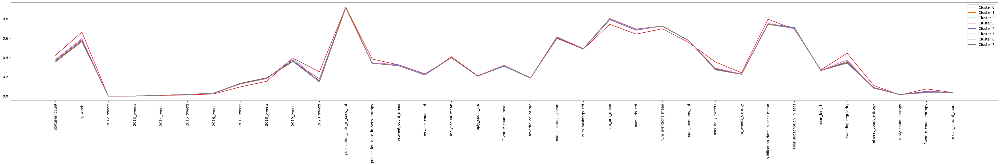

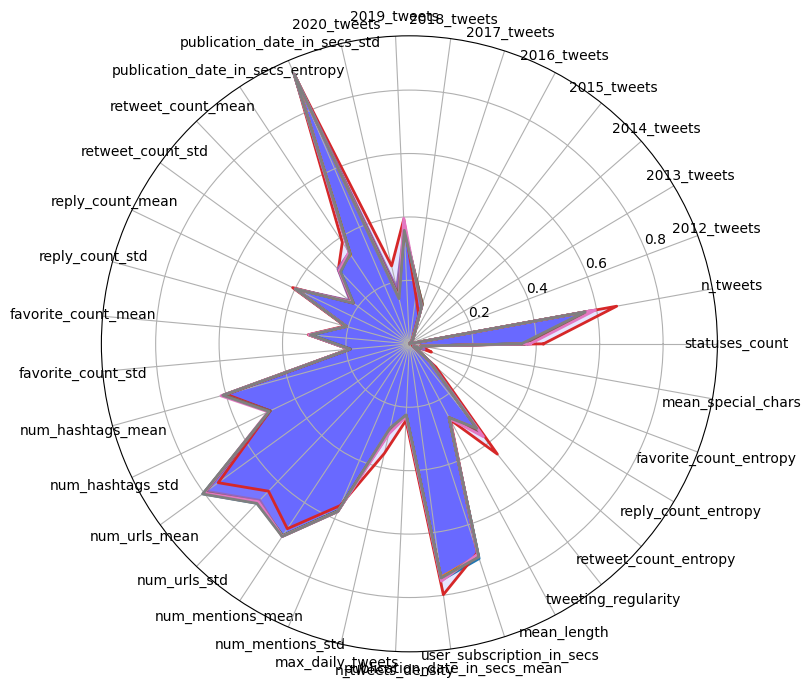

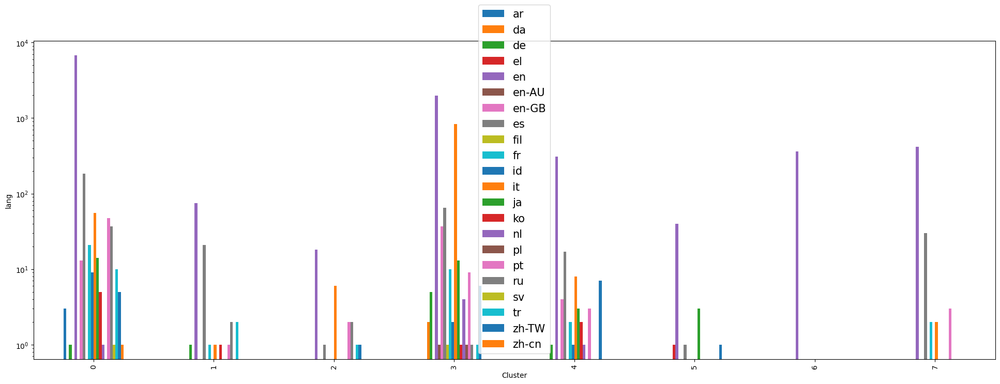

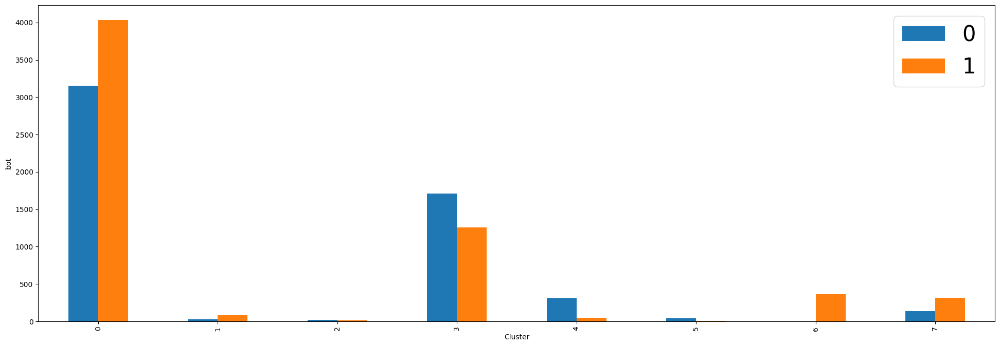

In [22]:
# Read dataset from text file
sample = df_merge_scaled[numeric_attributes].values
# Amount of cluster that should be allocated
amount = 10;
# Prepare initial means and covariances using K-Means initializer
initializer = ema_init_type.KMEANS_INITIALIZATION;
initial_means, initial_covariance = ema_initializer(sample, amount).initialize(initializer);
# Lets create observer to see clustering process
observer = ema_observer();
# Create instance of the EM algorithm
ema_instance = ema(sample, amount, initial_means, initial_covariance, observer=observer, tolerance=1e-1);
# Run clustering process
ema_instance.process();
# Extract clusters
clusters = ema_instance.get_clusters()
centroids = ema_instance.get_centers();
print(f'Number of clusters found:', np.shape(centroids)[0])

cluster_labels = dict()

'''
Since for each cluster is saved the index in list of data
it is needed to convert it in such a way that
we have a list as long as the data, and in each
position it is saved the corresponding label for the
data with that index
'''
for label in range(0, np.shape(clusters)[0]):
    for i in range(0, len(clusters[label])):
        cluster_labels[clusters[label][i]] = label

# Display allocated clusters using visualizer
covariances = ema_instance.get_covariances();


cluster_labels = dict(sorted(cluster_labels.items()))

get_metrics(df_merge_scaled[numeric_attributes], list(cluster_labels.values()))
plots(df_merge_scaled, np.array(list(cluster_labels.values())), path=f'ema', centroids=np.array(centroids), attributes = numeric_attributes)